<div class="alert alert-block alert-info">
<div style="text-align: center"><h1>Identifying Breast Cancer Malignancy<h1></div>

<div style="text-align: center"><img src="breast_cancer1.jpg" width=50% /></div><br>

<!-- <div style="text-align: center"><img src="breast_cancer2.jpg" width=50% /></div><br> -->

***
# Introduction
Early detection of cancerous growths through regular health check ups, screening programmes and/or routine self assessments, is vital for favourable prognosis.<br>
Breast cancer is the most common cancer in the UK<sup>__[1](https://www.cancerresearchuk.org/about-cancer/breast-cancer)__</sup>. Survival is generally good due to early detection programmes and awareness. It is more common in females than males with multiple contributing risk factors including age, familial history (_i.e._, genetics), and lifestyle (_e.g._, obesity, smoking).

# About the dataset
This dataset is provided by the University of California, Irvine Machine Learning Repository<sup>__[2](https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic)__</sup> and contains the nulcei morphologies extracted from digitised images of cells obtained from fine needle aspiration (FNA) of a breast mass<sup>__[3](https://www.semanticscholar.org/paper/Nuclear-feature-extraction-for-breast-tumor-Street-Wolberg/53f0fbb425bc14468eb3bf96b2e1d41ba8087f36)__</sup>. The cell nuclei features include radius, texture, perimeter, area, smoothness, compactness, concavity, concave points, symmetry and fractal dimension. 

<img src="breast_FNA.jpg" width=50% />

Fine-needle aspiration cytology of a breast lesion showing singly-lying epithelioid cells with irregular pleomorphic nuclei and moderate-to-abundant bluish cytoplasm (Giemsa stain: (a) 200×, (b) 400×) - adapted<sup>__[4](https://pubmed.ncbi.nlm.nih.gov/20179806/)__</sup>.

# Objective
Train and evaluate a suite of supervised machine learning algorithms to distinguish the difference between benign and malignant breast FNA-derived cells given nuclear morphology measurements.

# Methodology
Following exploratory data analysis and scaling (Robust), PCA was used to extract class distinguishing features.<br>
Guassian Mixture and KMeans were applied for cluster analysis, and ten classification models were assessed and evaluated for their predictive accuracy and to extract important features. 

# Main findings
Nucleus size is the main feature distinguishing malignant cells from benign ones.<br>
- Univariate analysis of the two classes demonstrates that malignant features are consistently larger than benign features.<br>
- Principle component analysis (PCA) confirmed this observation by placing more weight on size-associated parameters such as 'area' features (unscaled data), and 'area', 'perimeter' and 'radius' (scaled data).<br>

This discernible size difference was successfully exploited for unit testing of the best classification model.<br>

Both Gaussian Mixture (GMM) and KMeans performed well to segment benign and malignant cell types. However, GMM performed better than KMeans as measured by adjusted random index (ARI) score.<br>

All classification models tested performed highly (>90%) as assessed by accuracy, recall, precision and AUROC scores.<br>
The Random Forest (AdaBoost), linear support vector machine (SVC(lin)) and ExtraTrees models performed consistently well across all metrics, particularly having lower rates of missed malignant diagnosis (false negatives) - which is critical for cancer diagnosis.<br>

Important nuclei features varied depending on the classifier interrogated. In addition to size related features already identified by PCA, texture, compactness, and smoothness were also identified. 

# Conclusions and future directions
Morphological distinctions between malignant and benign breast cell nuclei were identified, allowing the successful application of both classification and clustering models with high accuracy. However, in the case of cancer diagnosis, particular consideration must be given to minimise the false negative rate (_i.e._, misdiagnosing a disease state as non-disease) to have confidence in the model's predictive ability.<br>

The models performed highly even on a relatively small dataset and without hyperparameter optimisation, reflecting the importance of the quality of the supplied data.<br>

The application of machine learning algorithms in healthcare can be transformative when applied with domain expertise.

***
***
# Modelling breast cell morphologies for cancer identification

In [1]:
from pandas import read_csv, DataFrame

from matplotlib.pyplot import subplots, show

from seaborn import pairplot, boxplot

from numpy import corrcoef, fill_diagonal, triu_indices, round, cumsum, arange, mean, where

from sklearn.preprocessing import StandardScaler, MinMaxScaler, Normalizer, RobustScaler
from sklearn.decomposition import PCA

from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans
from sklearn.metrics.cluster import adjusted_rand_score

from sklearn.svm import SVC, LinearSVC
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier
from sklearn.model_selection import train_test_split, StratifiedShuffleSplit
from sklearn.metrics import recall_score, precision_score, roc_curve, roc_auc_score

<div class="alert alert-block alert-success">
<h1>Exploratory Data Analysis & Preprocessing<h1>

In [2]:
# The breast cancer dataset can be downloaded from: https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic (I'll take this approach)
# Alternatively, this and other datasets can be imported directly from SKLearn: https://scikit-learn.org/stable/api/sklearn.datasets.html
# The advanatage of loading datasets from SKLearn is the use of the bundled dataset loading utilities: https://scikit-learn.org/stable/datasets.html#datasets
# Details of the breast cancer dataset can be found at: https://scikit-learn.org/stable/datasets/toy_dataset.html#breast-cancer-dataset

# df = read_csv('/Users/timbo/Coding/L2D0/Final Project/breast_cancer.csv')
df = read_csv('breast_cancer.csv')

print(df.shape)
print(df.columns)
df.head()

(569, 31)
Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')


,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,0,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,0,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,0,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,0,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [3]:
df.tail()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
564,0,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,0,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,0,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,0,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400
568,1,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,0.1587,...,9.456,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    int64  
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

In [5]:
# Check for missing data
# The above output reveals there are no missing data (so no need to impute), but here are different ways to check

# df.isnull().any()  # Returns a boolean for each feature: True = missing data; False = no missing data
df.isnull().sum()  # Sums missing data for each feature, so is a bit more informative than .any()

diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

In [6]:
# Check for duplicated samples
# df.duplicated()  # Returns a boolean for each sample/row
df.duplicated().sum()

np.int64(0)

<div class="alert alert-block alert-success">
<h1>Univariate & Class Analyses<h1>

In [7]:
# Univariate analyses
df.iloc[:, 1:].describe()  # Exclude 'diagnosis' class

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [8]:
# Investigate class ('diagnosis')
y_df = df['diagnosis']
print(y_df.nunique(), y_df.unique())  # 'diagnosis' consists of 2 different labels, 0s (malignant) and 1s (benign)

# y_counts = df['diagnosis'].value_counts()  # Count the number of 0s and 1s
y_counts = y_df.value_counts()  # Alternatively
# print(y_counts)

y_percent = y_df.value_counts(normalize=True) # Calculate the number of 0s and 1s as percentages
# print(y_percent)

y_total = y_counts.sum()

print(f"There are {y_total} samples:\n\
{y_counts[0]} ({round(y_percent[0]*100, 1)}%) Malignant ({y_df.unique()[0]})\n\
{y_counts[1]} ({round(y_percent[1]*100, 1)}%) Benign ({y_df.unique()[1]})")

2 [0 1]
There are 569 samples:
212 (37.3%) Malignant (0)
357 (62.7%) Benign (1)


In [9]:
# Inspect the malignant class (label = 0)
# df_malignant = df[df['diagnosis'] == 0]
df_malignant = df[y_df == 0]  # Alternatively...
df_malignant.describe()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,212.0,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,...,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000
mean,0.0,17.462830,21.604906,115.365377,978.376415,0.102898,0.145188,0.160775,0.087990,0.192909,...,21.134811,29.318208,141.370330,1422.286321,0.144845,0.374824,0.450606,0.182237,0.323468,0.091530
std,0.0,3.203971,3.779470,21.854653,367.937978,0.012608,0.053987,0.075019,0.034374,0.027638,...,4.283569,5.434804,29.457055,597.967743,0.021870,0.170372,0.181507,0.046308,0.074685,0.021553
min,0.0,10.950000,10.380000,71.900000,361.600000,0.073710,0.046050,0.023980,0.020310,0.130800,...,12.840000,16.670000,85.100000,508.100000,0.088220,0.051310,0.023980,0.028990,0.156500,0.055040
25%,0.0,15.075000,19.327500,98.745000,705.300000,0.094010,0.109600,0.109525,0.064620,0.174050,...,17.730000,25.782500,119.325000,970.300000,0.130475,0.244475,0.326425,0.152750,0.276500,0.076302
50%,0.0,17.325000,21.460000,114.200000,932.000000,0.102200,0.132350,0.151350,0.086280,0.189900,...,20.590000,28.945000,138.000000,1303.000000,0.143450,0.356350,0.404900,0.182000,0.310300,0.087600
75%,0.0,19.590000,23.765000,129.925000,1203.750000,0.110925,0.172400,0.203050,0.103175,0.209850,...,23.807500,32.690000,159.800000,1712.750000,0.155975,0.447850,0.556175,0.210675,0.359225,0.102625
max,0.0,28.110000,39.280000,188.500000,2501.000000,0.144700,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.170000,0.291000,0.663800,0.207500


In [10]:
# Inspect the benign class (label = 1)
# df_malignant = df[df['diagnosis'] == 1]
df_benign = df[y_df == 1]  # Alternatively...
df_benign.describe()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,357.0,357.000000,357.000000,357.000000,357.000000,357.000000,357.000000,357.000000,357.000000,357.000000,...,357.000000,357.000000,357.000000,357.000000,357.000000,357.000000,357.000000,357.000000,357.000000,357.000000
mean,1.0,12.146524,17.914762,78.075406,462.790196,0.092478,0.080085,0.046058,0.025717,0.174186,...,13.379801,23.515070,87.005938,558.899440,0.124959,0.182673,0.166238,0.074444,0.270246,0.079442
std,0.0,1.780512,3.995125,11.807438,134.287118,0.013446,0.033750,0.043442,0.015909,0.024807,...,1.981368,5.493955,13.527091,163.601424,0.020013,0.092180,0.140368,0.035797,0.041745,0.013804
min,1.0,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156600,0.055210
25%,1.0,11.080000,15.150000,70.870000,378.200000,0.083060,0.055620,0.020310,0.015020,0.158000,...,12.080000,19.580000,78.270000,447.100000,0.110400,0.112000,0.077080,0.051040,0.240600,0.070090
50%,1.0,12.200000,17.390000,78.180000,458.400000,0.090760,0.075290,0.037090,0.023440,0.171400,...,13.350000,22.820000,86.920000,547.400000,0.125400,0.169800,0.141200,0.074310,0.268700,0.077120
75%,1.0,13.370000,19.760000,86.100000,551.100000,0.100700,0.097550,0.059990,0.032510,0.189000,...,14.800000,26.510000,96.590000,670.000000,0.137600,0.230200,0.221600,0.097490,0.298300,0.085410
max,1.0,17.850000,33.810000,114.600000,992.100000,0.163400,0.223900,0.410800,0.085340,0.274300,...,19.820000,41.780000,127.100000,1210.000000,0.200600,0.584900,1.252000,0.175000,0.422800,0.148600


In [11]:
# Check out the means of the features of the classes ('diagnosis')
df.groupby('diagnosis').mean()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
diagnosis,,,,,,,,,,,,,,,,,,,,,
0,17.462830,21.604906,115.365377,978.376415,0.102898,0.145188,0.160775,0.087990,0.192909,0.062680,...,21.134811,29.318208,141.370330,1422.286321,0.144845,0.374824,0.450606,0.182237,0.323468,0.091530
1,12.146524,17.914762,78.075406,462.790196,0.092478,0.080085,0.046058,0.025717,0.174186,0.062867,...,13.379801,23.515070,87.005938,558.899440,0.124959,0.182673,0.166238,0.074444,0.270246,0.079442


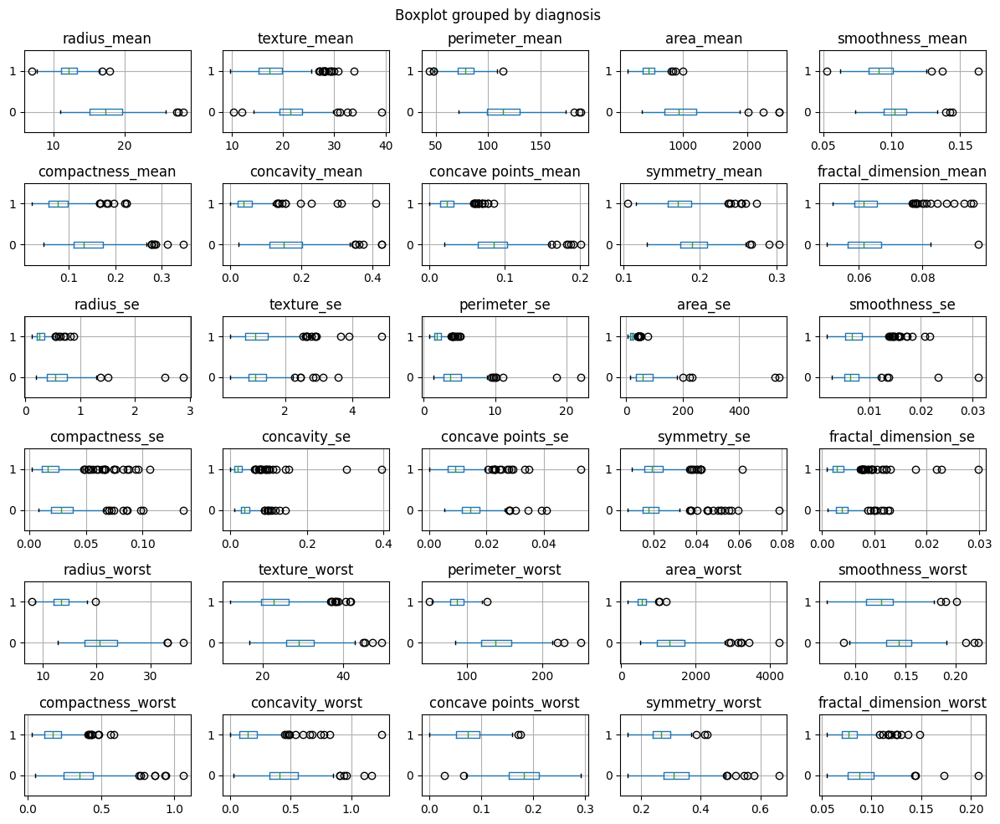

In [12]:
# Use boxplot to interrogate how the features relate to the classes ('diagnosis')

features_df = df.drop(columns='diagnosis')  # Dataframe of only features, excluding 'diagnosis' class

fig, axes = subplots(nrows=6, ncols=5, figsize=(12, 10))

for col, ax in zip(features_df, axes.ravel()):
    df[[col, 'diagnosis']].boxplot(vert=False, by='diagnosis', ax=ax)
    ax.set_ylabel('')  # Suppress y-label

fig.tight_layout()

show()

<div class="alert alert-block alert-info">
<h3>It is clear from the means and the boxplot that malignant (0) features are generally larger than benign (1) features.<br>
We can use this discernible difference to our advantage!

In [13]:
# Define X and y

# As a Pandas dataframe
X_df = df.drop(columns='diagnosis')  # Dataframe of only features, excluding 'diagnosis' class
y_df = df['diagnosis']  # Dataframe of only 'diagnosis' class, excluding features

# As a NumPy array
# data_np = df.to_numpy()
# X = data_np[:, 1:]  # Features, excluding 'diagnosis' class
X = X_df.to_numpy()  # Alternatively
# y = data_np[:, 0]  # 'diagnosis' class labels, excluding features
y = y_df.to_numpy()  # Alternatively

print(X_df.shape, X.shape, y_df.shape, y.shape)

(569, 30) (569, 30) (569,) (569,)


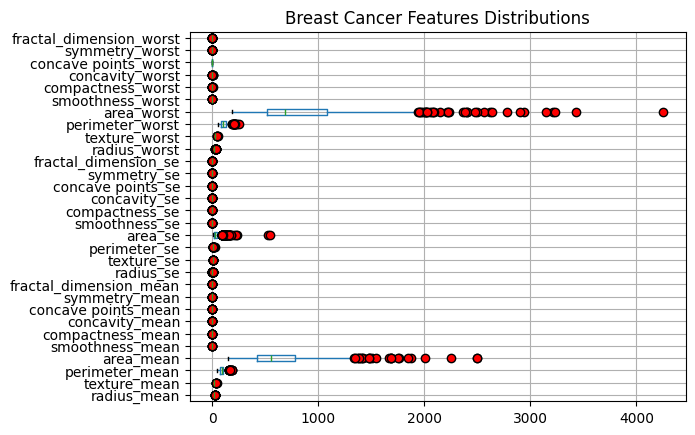

In [14]:
# Boxplot to inspect data distribution

X_df.boxplot(vert=False, flierprops=dict(markerfacecolor='red')).set(title='Breast Cancer Features Distributions');

# Alternatively, using subplots()
# fig, ax = subplots(figsize=(6, 3))

# ax.boxplot(X, flierprops=dict(markerfacecolor='red'))
# ax.set_title('Breast Cancer Features Distributions')
# ax.set_xlabel('Features')
# ax.set_ylabel('Values')

# show()

<div class="alert alert-block alert-info">
<h3>From the boxplot, the features `area_worst`, `perimeter_worst`, `area_se`, `area_mean` and `perimeter_mean` are skewed towards high values.<br>

Furthermore, the feature values differ by up to four orders of magnitude. Subsequent analyses would benefit from scaling.

In [15]:
# Scaled data
std_scl = StandardScaler()
X_scaledSTD = std_scl.fit_transform(X)

minmax_scl = MinMaxScaler()
X_scaledMM = minmax_scl.fit_transform(X)

norm_scl = Normalizer()
X_scaledN = norm_scl.fit_transform(X)

rob_scl = RobustScaler()
X_scaledRob = rob_scl.fit_transform(X)

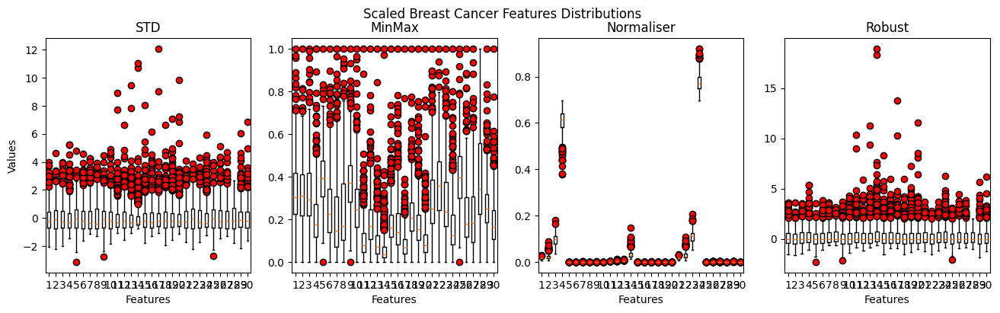

In [16]:
# Boxplot to inspect scaled feature distributions
fig, ax = subplots(ncols=4, figsize=(16, 4))

ax[0].boxplot(X_scaledSTD, flierprops=dict(markerfacecolor='red'))
ax[0].set_title('STD')
ax[0].set_xlabel('Features')
ax[0].set_ylabel('Values')

ax[1].boxplot(X_scaledMM, flierprops=dict(markerfacecolor='red'))
ax[1].set_title('MinMax')
ax[1].set_xlabel('Features')

ax[2].boxplot(X_scaledN, flierprops=dict(markerfacecolor='red'))
ax[2].set_title('Normaliser')
ax[2].set_xlabel('Features')

ax[3].boxplot(X_scaledRob, flierprops=dict(markerfacecolor='red'))
ax[3].set_title('Robust')
ax[3].set_xlabel('Features')

fig.suptitle('Scaled Breast Cancer Features Distributions')

show()

<div class="alert alert-block alert-info">
<h3>The scalers remove the order of magnitude differences. However, scalers such as STD and MinMax can be sensitive to skewed data whilst Robust scaler is less so (being reliant on median and quartiles rather than mean and variance).

<div class="alert alert-block alert-success">
<h1>Bivariate Analysis<h1>

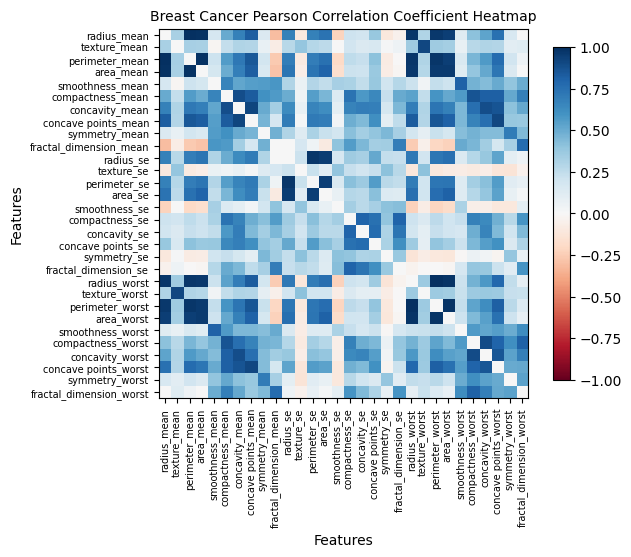

In [17]:
# Bivariate Analysis - Pearson Correlation Coefficient
cc_mat = corrcoef(X, rowvar=False)  # rowvar=False: Correlation will be between columns/features

fill_diagonal(cc_mat, 0)  # Remove self-correlations (which are equal to 1) by setting them to 0

fig, ax = subplots()

n_ticks = [i for i in range(len(X_df.columns))]  # Number of axis ticks
# axis_labels = [i for i in range(0, cc_mat.shape[0]+1, 5)]  # Use feature indices as labels
axis_labels = X_df.columns  # Use feature names as labels

img = ax.imshow(cc_mat, cmap='RdBu', vmin=-1, vmax=1)
ax.set_title('Breast Cancer Pearson Correlation Coefficient Heatmap', fontsize=10)
ax.set_xticks(n_ticks)
ax.set_xticklabels(axis_labels, rotation=90, fontsize=7)
ax.set_xlabel('Features')
ax.set_yticks(n_ticks)
ax.set_yticklabels(axis_labels, fontsize=7)
ax.set_ylabel('Features')
fig.colorbar(img, shrink=0.9)

show()

<div class="alert alert-block alert-info">
<h3>From the heatmap above, it is clear that most correlation coefficients are positive with only a few weakly negative correlations. Unsurprisingly, the 'radius', 'perimeter' and 'area' features all exhibit very strong positive correlations.

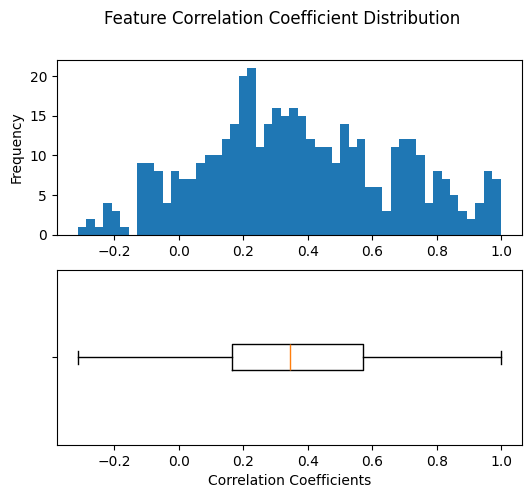

In [18]:
# Extract the correlation coefficients (only need the top right correlation coefficients of the matrix, since it is mirrored along the diagonal)
# and plot on a histogram/boxplot to visualise distribution.

n_rows = cc_mat.shape[0]  # Get the number of rows (or columns since it is a square matrix) of the correlation coefficient matrix
corr_coeff_ind = triu_indices(n_rows, k=1)  # Get the indices of the correlation coefficients; k=1 excludes the diagonal correlation coefficients
corr_coeffs = cc_mat[corr_coeff_ind]  # Return the ((30x30)-30)/2 = 435) correlation coefficents as a 1D array
# print(corr_coeffs.shape)

fig, ax = subplots(nrows=2, figsize=(6, 5))

bins = 50
ax[0].hist(corr_coeffs, bins=bins)
ax[0].set_ylabel('Frequency')

ax[1].boxplot(corr_coeffs, vert=False, tick_labels=[''])
ax[1].set_xlabel('Correlation Coefficients')

fig.suptitle('Feature Correlation Coefficient Distribution')

show()

<div class="alert alert-block alert-info">
<h3>Most correlations are positive and weak. Few are positive and strong (>0.8; between 'radius', 'perimeter' and 'area'). Fewer are negative and weak.

In [19]:
# Seaborn pairwise plot of features
pairplot(df, hue='diagnosis', diag_kind='kde', corner=True)
show()

<div class="alert alert-block alert-info">
<h3>At a glance, there seems to be discernible separation between the two classes (malignant and benign), so classification looks promising.

<div class="alert alert-block alert-success">
<h1>PCA<h1>

## Unscaled data

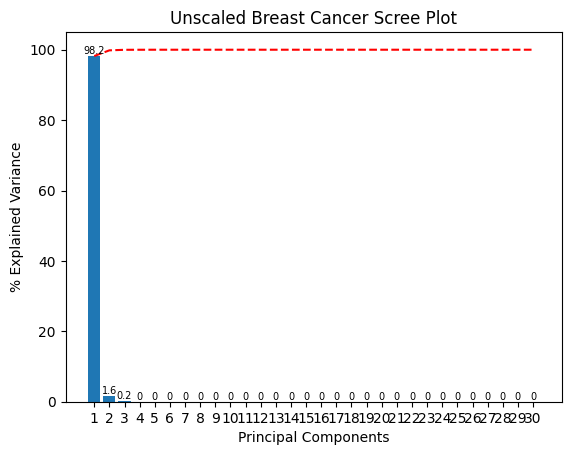

In [20]:
# PCA of unscaled data

def scree_plot(exp_var, cum_exp_var, title=""):
    """
    Given the explained variances/Eigenvalues of a PCA, plots a scree plot 
    :param exp_var: PCA explained variance
    :type exp_var: NumPy array
    :param cum_exp_var: cumulative explained variance
    :type cum_exp_var: NumPy array
    :param title: str (optional)
    :rtype: matplotlib bar graph
    """
    # plt_labels = ['PC' + str(x) for x in range(1, len(exp_var)+1)]
    plt_labels = [str(x) for x in range(1, len(exp_var)+1)]

    fig, ax = subplots()

    bar_con = ax.bar(x=range(1, len(exp_var)+1), height=exp_var, tick_label=plt_labels)
    ax.bar_label(bar_con, fontsize=7)  # .bar_label() uses the the data values (i.e., height=exp_var) from the container (bar_con) as labels
    ax.plot(range(1, len(exp_var)+1), cum_exp_var, 'r--')
    ax.set_ylabel(f'% Explained Variance')
    ax.set_xlabel('Principal Components')
    ax.set_title(f"{title} Scree Plot")

    show()


pca = PCA()

X_pca = pca.fit(X)

evr = round(pca.explained_variance_ratio_ * 100, 1)  # Obtain the normalised principal component values (eigenvalues)
# print(evr)

cum_evr = cumsum(pca.explained_variance_ratio_ * 100)  # Cumulative summation of explained variances/eigenvalues
# print(cum_evr)

scree_plot(evr, cum_evr, 'Unscaled Breast Cancer')

In [21]:
# Number of PCs needed to attain cummulative explained variance of a specified cutoff

def numPC(exp_var, cum_exp_var, cutoff=99.0):
    """
    Returns the number of Principal Components needed to reach a desired threshold/cutoff of cumulative explained variances
    :param exp_var: Explained Variance/Eigenvalues
    :type exp_var: NumPy array
    :param cum_exp_var: Cumulative sum of explained variances/eigenvalues
    :type cum_exp_var: NumPy array
    :param cutoff: Desired value of cumulative sum of explained variances/eigenvalues (optional)
    :type cutoff: int, float (0-100%), default=99.0
    """
    num_pc = [i for i in range(len(exp_var)) if cum_exp_var[i] >= cutoff][0] + 1  # Returns the index of cumulative PC Eigenvalues that meets the cutoff
    print(f"The number of PCs to attain {cutoff}% explained variance = {num_pc}.")
    return num_pc


num_pc = numPC(evr, cum_evr)

The number of PCs to attain 99.0% explained variance = 2.


In [22]:
# PCA with n_components determined for 99% explained variance
pca = PCA(n_components=num_pc)  # Number of PCs for 99% of explained variances

X_pca = pca.fit_transform(X)  # Fit and return the reduced dataset

evr = round(pca.explained_variance_ratio_ * 100, 1)  # Obtain the normalised principal component values (Eigenvalues)
# print(evr)

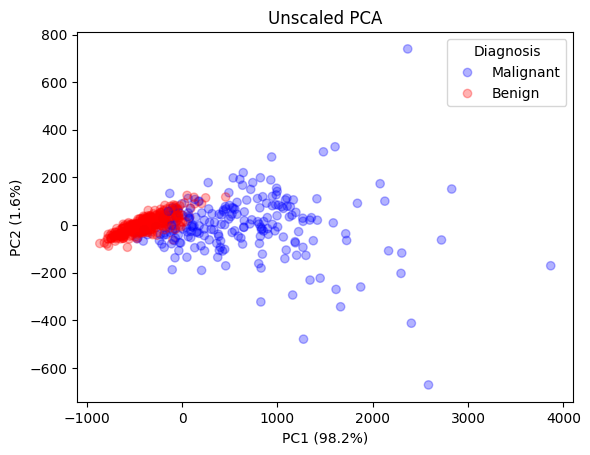

In [23]:
# Plot PC1 v PC2
y_labels = ['Malignant', 'Benign']  # Create labels for scatter plot legend: Malignant = 0; Benign = 1

fig, ax = subplots()

im = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=y, cmap='bwr', alpha=0.3)  # Colour points according to diagnosis class labels (0, 1). Alternatively, c=df.diagnosis
ax.set_title('Unscaled PCA')
ax.set_xlabel(f'PC1 ({evr[0]}%)')
ax.set_ylabel(f'PC2 ({evr[1]}%)')

# ax.legend(*im.legend_elements(), ncols=2, title="Diagnosis", loc='upper center')
ax.legend(handles=im.legend_elements()[0], labels=y_labels, title="Diagnosis")

show()

In [24]:
# Explore the feature importances
# Obtain the feature weights from the PC eigenvectors

feature_weights = pca.components_  # Feature weights (aka loading scores) (.components_) are the Eigenvectors of the principal components PC1 & PC2
# print(f"Eigenvectors of PCs:\n{feature_weights}")

# Create new dataframe with feature weights of the PCs
feature_weights_df = DataFrame(feature_weights.T, columns=[f'PC{i}' for i in range(1, len(feature_weights)+1)], index=X_df.columns)
feature_weights_df

,PC1,PC2
radius_mean,5.086232e-03,9.287056e-03
texture_mean,2.196570e-03,-2.881607e-03
perimeter_mean,3.507633e-02,6.274808e-02
area_mean,5.168265e-01,8.518237e-01
smoothness_mean,4.236945e-06,-1.481944e-05
compactness_mean,4.052600e-05,-2.688622e-06
concavity_mean,8.193995e-05,7.514196e-05
concave points_mean,4.778078e-05,4.635010e-05
symmetry_mean,7.078043e-06,-2.524304e-05
fractal_dimension_mean,-2.621553e-06,-1.611971e-05


In [25]:
# Top features of PC1
feature_weights_ranked = feature_weights_df.iloc[:, 0].sort_values(ascending=False)  # Sort eigenvectors of PC1
top_n = 3  # Number of ranked features
print(f"The top {top_n} features of PC1 with the highest weights are:\n{feature_weights_ranked[:top_n]}" )

The top 3 features of PC1 with the highest weights are:
area_worst    0.852063
area_mean     0.516826
area_se       0.055727
Name: PC1, dtype: float64


<div class="alert alert-block alert-info">
<h3>As pointed out earlier, the area metrics (area_worst, area_mean and area_se) dominate the feature weights when unscaled.

## Scaled data

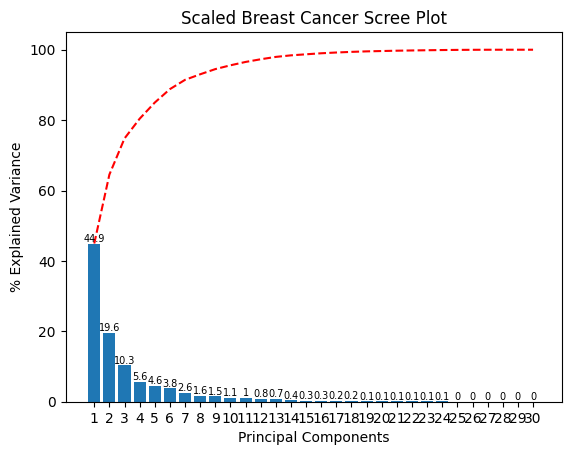

The number of PCs to attain 99.0% explained variance = 17.


In [26]:
# PCA of Robust scaled data
pca_scaled = PCA()
X_scaled_pca = pca_scaled.fit(X_scaledRob)

evr_scaled = round(pca_scaled.explained_variance_ratio_ * 100, 1)  # Obtain the principal component values (Eigenvalues)
# print(evr_scaled)

cum_evr_scaled = cumsum(pca_scaled.explained_variance_ratio_ * 100)
# print(cum_evr_scaled)

scree_plot(evr_scaled, cum_evr_scaled, 'Scaled Breast Cancer')

num_pc_scaled = numPC(evr_scaled, cum_evr_scaled)  # Get the number of PCs for 99% explained variance

In [27]:
# PCA with n_components determined for 99% cummulative explained variances
pca_scaled = PCA(n_components=num_pc_scaled)  # Number of PCs for 99% of explained variances

X_scaled_pca = pca_scaled.fit_transform(X_scaledRob)  # Fit and return the reduced dataset

evr_scaled = round(pca_scaled.explained_variance_ratio_ * 100, 1)  # Obtain the principal component values (Eigenvalues)
# print(evr_scaled)

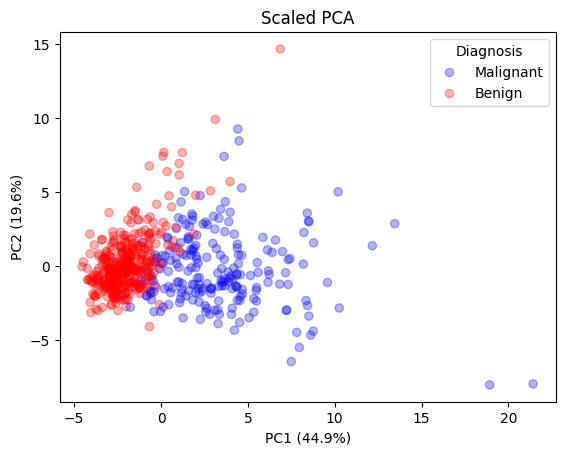

In [28]:
# Plot PC1 v PC2
y_labels = ['Malignant', 'Benign']  # Create labels for scatter plot legend: Malignant = 0; Benign = 1

fig, ax = subplots()

im = ax.scatter(X_scaled_pca[:, 0], X_scaled_pca[:, 1], c=y, cmap='bwr', alpha=0.3)  # Colour points according to diagnosis classes/labels (0, 1). Alternatively, c=df.diagnosis
ax.set_title('Scaled PCA')
ax.set_xlabel(f'PC1 ({evr_scaled[0]}%)')
ax.set_ylabel(f'PC2 ({evr_scaled[1]}%)')

# ax.legend(*im.legend_elements(), ncols=2, title="Diagnosis", loc='upper center')
ax.legend(handles=im.legend_elements()[0], labels=y_labels, title="Diagnosis")

show()

In [29]:
# Obtain the feature weights from the PC eigenvectors

feature_weights_scaled = pca_scaled.components_  # Feature weights (aka loading scores) (.components_) are the Eigenvectors of the principal components PC1 & PC2
# print(f"Eigenvectors of PCs:\n{feature_weights}")

# Create new dataframe with feature weights of PCs
feature_weights_scaled_df = DataFrame(feature_weights_scaled.T, columns=[f'PC{i}' for i in range(1, len(feature_weights_scaled)+1)], index=X_df.columns)
feature_weights_scaled_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17
radius_mean,0.209532,-0.171915,-0.090548,0.087061,0.001062,0.048562,0.196708,-0.201351,0.050267,0.029288,-0.035086,-0.001195,-0.048549,0.034041,0.016567,-0.074893,0.114851
texture_mean,0.081283,-0.022578,-0.017431,0.082248,0.584300,-0.104109,-0.076495,0.034375,-0.159494,0.108741,0.244682,-0.323707,-0.335335,-0.007314,-0.003995,-0.056051,0.122971
perimeter_mean,0.210221,-0.150024,-0.090856,0.078977,-0.000496,0.043504,0.182901,-0.190890,0.059620,0.004774,-0.020361,0.008020,-0.077420,0.025875,0.015509,-0.072567,0.070734
area_mean,0.242520,-0.192939,-0.056744,0.071362,-0.011143,0.027401,0.171021,-0.216882,0.002347,0.049801,-0.117495,0.033591,-0.106032,-0.003153,0.161959,-0.023988,0.099146
smoothness_mean,0.097363,0.139129,-0.078502,-0.301569,-0.109068,-0.251565,0.166041,0.097504,0.320575,-0.029455,-0.123490,-0.291142,-0.133369,0.442150,-0.064532,-0.016930,0.208629
compactness_mean,0.187554,0.158300,-0.133177,-0.041109,-0.027165,-0.032788,0.013495,-0.081530,0.174739,-0.220065,0.183951,0.047839,-0.261063,0.013669,-0.013716,0.137833,-0.222717
concavity_mean,0.208072,0.089638,-0.082313,0.062829,-0.008731,0.003439,0.100935,0.104699,0.054763,-0.076087,-0.157673,0.087351,-0.290105,-0.170720,-0.077367,-0.231435,-0.304803
concave points_mean,0.195761,0.004796,-0.089245,-0.023740,-0.021215,-0.034080,0.165521,-0.041037,0.168157,-0.049869,0.004919,-0.031280,-0.127624,-0.136026,0.000690,-0.237466,-0.339281
symmetry_mean,0.105479,0.166600,-0.060831,-0.318137,0.018356,0.232534,0.060623,0.124426,0.223137,0.560408,0.296568,0.369138,-0.220159,0.000033,-0.003288,-0.052918,0.265237
fractal_dimension_mean,0.036322,0.321075,-0.020088,-0.127440,-0.089140,-0.153227,-0.219194,-0.105965,0.193948,-0.030729,-0.079207,-0.144880,-0.248271,-0.378151,0.231378,0.475009,-0.105201


In [30]:
# Top features of PC1
feature_weights_scaled_ranked = feature_weights_scaled_df.iloc[:, 0].sort_values(ascending=False)
top_n = 3  # Number of ranked features
print(f"The top {top_n} features with the highest weights:\n{feature_weights_scaled_ranked[:top_n]}" )

The top 3 features with the highest weights:
area_se         0.419117
perimeter_se    0.296539
radius_se       0.285065
Name: PC1, dtype: float64


<div class="alert alert-block alert-info">
<h3>Use of Robust scaler to mitigate the order of magnitude differences in the data set resulted in a greater number of PCs than unscaled data, 17 compared to 2, respectively (for 99% explained variance).<br><br>
The feature rankings differ depending on data scaling. Unscaled data favours 'area' features, suggesting the different orders of magnitude of the data masked the feature variances, but are exposed by scaling. 

<div class="alert alert-block alert-success">
<h1>Clustering - GaussianMixture & KMeans<h1>

In [31]:
# GaussianMixture clustering
# Assess optimal number of components for unscaled and scaled data using ARI (adjusted random index) score

RNDM_STATE = 962

for n in range(2, 6, 1):  # Test n_components = 2—5
    gmm = GaussianMixture(n_components=n, random_state=RNDM_STATE)
    y_pred_gmm = gmm.fit_predict(X)  # Fit and return the predicted class labels for unscaled data
    y_pred_scaled_gmm = gmm.fit_predict(X_scaledRob)  # Fit and return the predicted class labels for scaled data
    # Measure the ARI scores
    ari_gmm = adjusted_rand_score(y, y_pred_gmm)
    ari_scaled_gmm = adjusted_rand_score(y, y_pred_scaled_gmm)

    print(f"For n_components={n}: ARI={round(ari_gmm, 3)}, ARI(scaled)={round(ari_scaled_gmm, 3)}")

For n_components=2: ARI=0.812, ARI(scaled)=0.78
For n_components=3: ARI=0.583, ARI(scaled)=0.585
For n_components=4: ARI=0.347, ARI(scaled)=0.514
For n_components=5: ARI=0.279, ARI(scaled)=0.402


GMM with n_components = 2 returned the best ARI scores for scaled & unscaled data.

In [32]:
# KMeans clustering
# Assess optimal number of clusters for unscaled and scaled data using ARI (adjusted random index) score

for n in range(2, 6, 1):  # Test n_clusters = 2—5
    km = KMeans(n_clusters=n, random_state=RNDM_STATE)
    y_pred_km = km.fit_predict(X)  # Fit and return the predicted class labels for unscaled data
    y_pred_scaled_km = km.fit_predict(X_scaledRob)  # Fit and return the predicted class labels for scaled data
    # Measure the ARI scores
    ari_km = adjusted_rand_score(y, y_pred_km)
    ari_scaled_km = adjusted_rand_score(y, y_pred_scaled_km)

    print(f"For n_clusters={n}: ARI={round(ari_km, 3)}, ARI(scaled){round(ari_scaled_km, 3)}")

For n_clusters=2: ARI=0.491, ARI(scaled)0.624
For n_clusters=3: ARI=0.537, ARI(scaled)0.484
For n_clusters=4: ARI=0.413, ARI(scaled)0.524
For n_clusters=5: ARI=0.415, ARI(scaled)0.401


<div class="alert alert-block alert-info">
<h3>KMeans ARI scores are poor compared to GMM, especially for n_clusters = 2.<br><br>
Since the class ('diagnosis') is malignant(0) or benign(1), the clustering outcomes are best when n_components and n_clusters are 2.<br><br>
We saw earlier how important scaling affects the data analyses. Therefore, will proceed with scaled data.

In [33]:
# GMM with n_components=2
n_c = 2
gmm = GaussianMixture(n_components=n_c, random_state=RNDM_STATE)
y_pred_scaled_gmm = gmm.fit_predict(X_scaledRob)

# Kmeans with n_clusters=2
km = KMeans(n_clusters=n_c, random_state=RNDM_STATE)
y_pred_scaled_km = km.fit_predict(X_scaledRob)

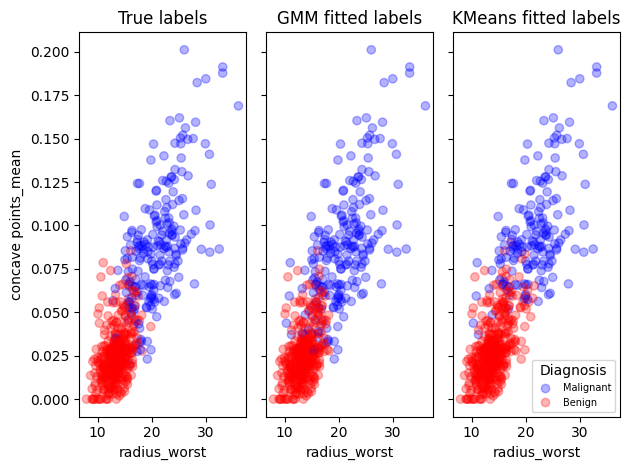

In [34]:
# Scatter plot of two select features (radius_worst and concave points_mean) coloured using true and predicted labels (GMM with n_components=2; KMeans with n_clusters=2)

fig, ax = subplots(ncols=3, sharey=True)

ax[0].scatter(X_df['radius_worst'], X_df['concave points_mean'], c=y, cmap='bwr', alpha=0.3)
ax[0].set_title('True labels')
ax[0].set_xlabel('radius_worst')
ax[0].set_ylabel('concave points_mean')

ax[1].scatter(X_df['radius_worst'], X_df['concave points_mean'], c=y_pred_scaled_gmm, cmap='bwr', alpha=0.3)
ax[1].set_title('GMM fitted labels')
ax[1].set_xlabel('radius_worst')

ax[2].scatter(X_df['radius_worst'], X_df['concave points_mean'], c=y_pred_scaled_km, cmap='bwr', alpha=0.3)
ax[2].set_title('KMeans fitted labels')
ax[2].set_xlabel('radius_worst')

ax[2].legend(handles=im.legend_elements()[0], loc='lower right', labels=y_labels, title="Diagnosis", fontsize=7)

fig.tight_layout()

show()

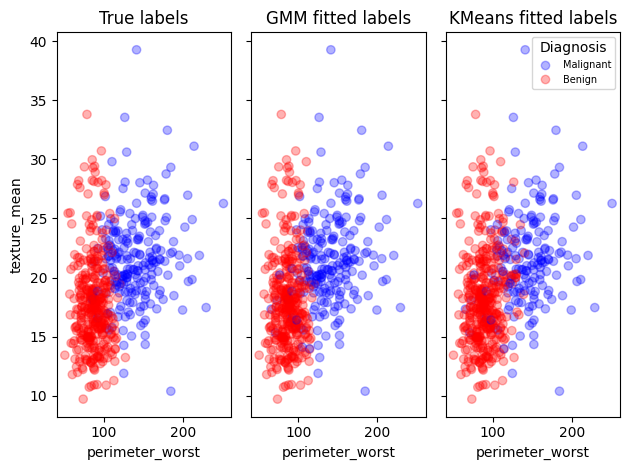

In [35]:
# Scatter plot of another two select features (perimeter_worst and texture_mean) coloured using true and predicted labels (GMM with n_components=2; KMeans with n_clusters=2)

fig, ax = subplots(ncols=3, sharey=True)

ax[0].scatter(X_df['perimeter_worst'], X_df['texture_mean'], c=y, cmap='bwr', alpha=0.3)
ax[0].set_title('True labels')
ax[0].set_xlabel('perimeter_worst')
ax[0].set_ylabel('texture_mean')

ax[1].scatter(X_df['perimeter_worst'], X_df['texture_mean'], c=y_pred_scaled_gmm, cmap='bwr', alpha=0.3)
ax[1].set_title('GMM fitted labels')
ax[1].set_xlabel('perimeter_worst')

ax[2].scatter(X_df['perimeter_worst'], X_df['texture_mean'], c=y_pred_scaled_km, cmap='bwr', alpha=0.3)
ax[2].set_title('KMeans fitted labels')
ax[2].set_xlabel('perimeter_worst')

ax[2].legend(handles=im.legend_elements()[0], loc='upper right', labels=y_labels, title="Diagnosis", fontsize=7)

fig.tight_layout()

show()

<div class="alert alert-block alert-info">
<h3>It is clear from the scatter plots and the ARI scores that KMeans clustering is inferior to GMM, at least by these limited metrics.

### Further exploration of optimal 'n_clusters' for KMeans clustering using silhouette score.

For n_clusters = 2 The average silhouette_score is: 0.6972646156059465
For n_clusters = 3 The average silhouette_score is: 0.6467642159647962
For n_clusters = 4 The average silhouette_score is: 0.5334614737117133
For n_clusters = 5 The average silhouette_score is: 0.5110985203777317


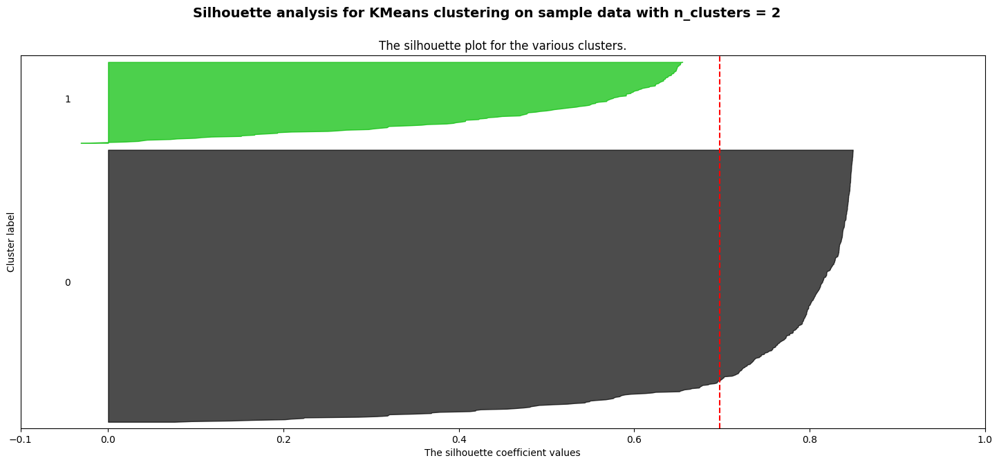

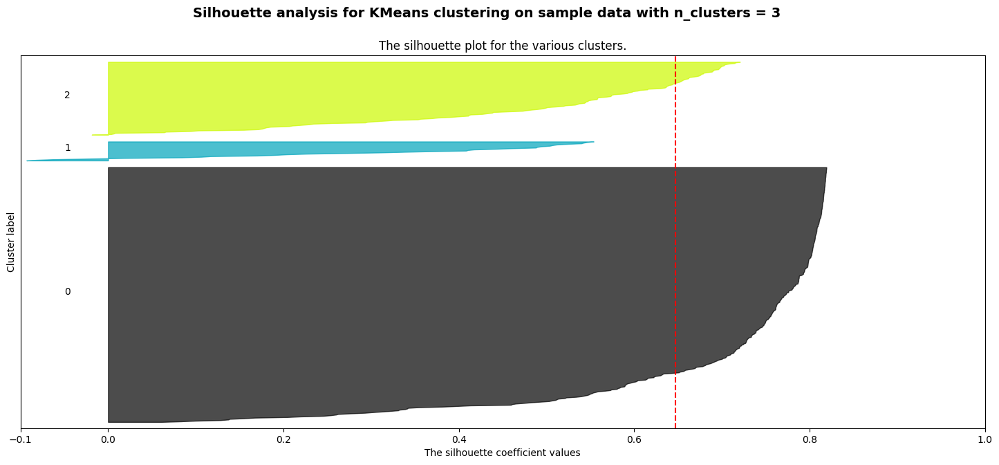

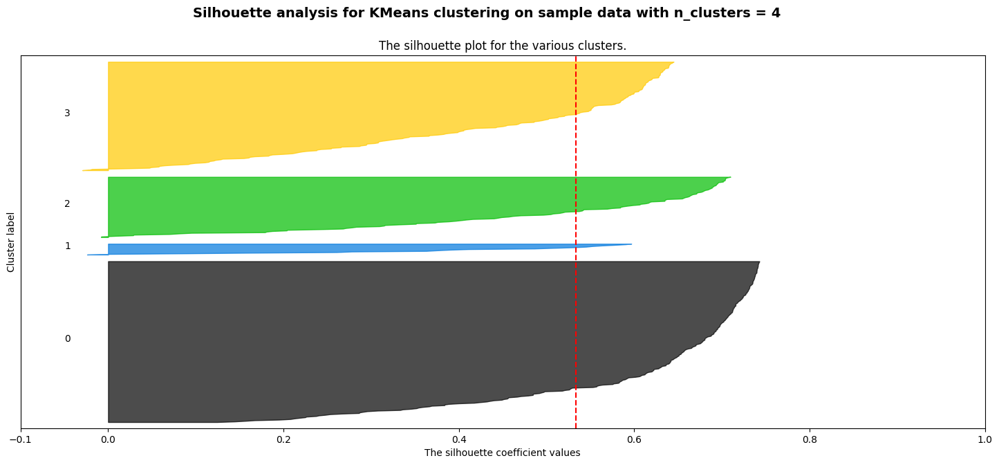

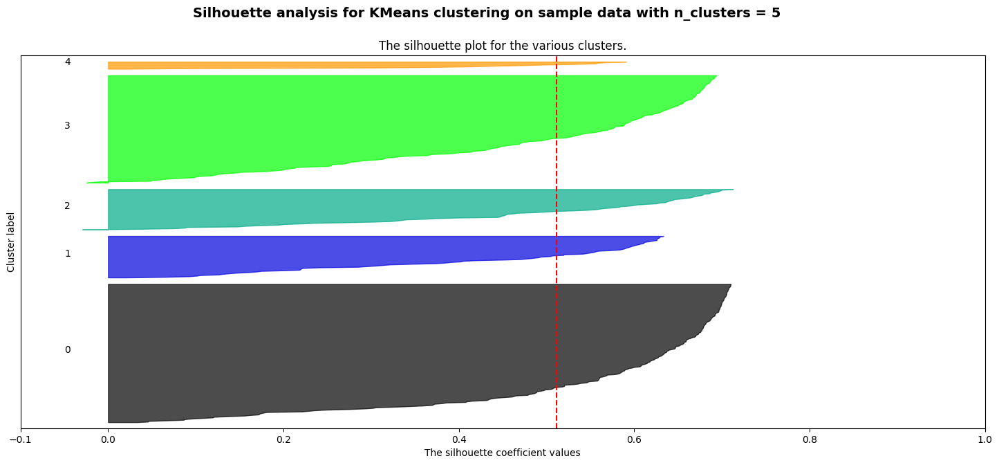

In [36]:
# Code adapted from https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py
def km_opt_cluster(X, max_k):
    import matplotlib.cm as cm
    import matplotlib.pyplot as plt
    import numpy as np
    from sklearn.cluster import KMeans
    from sklearn.metrics import silhouette_samples, silhouette_score

    range_n_clusters = [i for i in range(2, max_k+1, 1)]

    for n_clusters in range_n_clusters:
        # Create a subplot with 1 row and 2 columns
        # fig, (ax1, ax2) = plt.subplots(1, 2)
        fig, (ax1) = plt.subplots(1)
        fig.set_size_inches(18, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all are positive
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator seed of 111 for reproducibility.
        clusterer = KMeans(n_clusters=n_clusters, random_state=111)
        cluster_labels = clusterer.fit_predict(X)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed clusters
        silhouette_avg = silhouette_score(X, cluster_labels)
        print("For n_clusters =", n_clusters, "The average silhouette_score is:", silhouette_avg)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color,
                edgecolor=color,
                alpha=0.7,
            )

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        # colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        # ax2.scatter(X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k")

        # Labeling the clusters
        # centers = clusterer.cluster_centers_
        # Draw white circles at cluster centers
        # ax2.scatter(
            # centers[:, 0],
            # centers[:, 1],
            # marker="o",
            # c="white",
            # alpha=1,
            # s=200,
            # edgecolor="k",
        # )

        # for i, c in enumerate(centers):
            # ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

        # ax2.set_title("The visualization of the clustered data.")
        # ax2.set_xlabel("Feature space for the 1st feature")
        # ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(
            "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
            % n_clusters,
            fontsize=14,
            fontweight="bold",
        )

    plt.show()

km_opt_cluster(X, 5)
# km_opt_cluster(X_scaledRob, 5)

<div class="alert alert-block alert-info">
<h3>The low average silhouette scores suggest KMeans is unable to effectively cluster the data.<br><br>This is supported by the lower ARI scores and inferior segmentation in the  scatter plots compared to GMM clustering.

<div class="alert alert-block alert-success">
<h1>Classification<h1>

In [37]:
# Explore 10 classifiers
RNDM_STATE = 962

classifiers = {'Random Forest': RandomForestClassifier(random_state=RNDM_STATE),
               'AdaBoost (Random Forest)': AdaBoostClassifier(RandomForestClassifier(random_state=RNDM_STATE)),
               'ExtRa Trees': ExtraTreesClassifier(random_state=RNDM_STATE),
               'AdaBoost (Extra Tree)': AdaBoostClassifier(ExtraTreesClassifier(random_state=RNDM_STATE)),
               'Decision Tree': DecisionTreeClassifier(random_state=RNDM_STATE),
               'SVC (RBF)': SVC(random_state=RNDM_STATE),
               'SVC (Linear)': LinearSVC(random_state=RNDM_STATE),
               'Naive Bayes': GaussianNB(),
               'K-Nearest Neighbours': KNeighborsClassifier(),
               'Multi-Layer Perceptron': MLPClassifier(max_iter=5000, random_state=RNDM_STATE)}

In [38]:
def plot_confusion_matrix(y_true, y_pred, classes, normalize=True, ax=None):
    """
    This function prints/plots the confusion matrix (adapted from a SciKit-Learn example)

    y_true: Actual class labels (array)
    y_pred: Predicted class labels (array)
    classes: Class names (str, array)
    normalize: Normalize the results (True), or show as integer values (False)
    ax: Visualization axis
    """

    from itertools import product
    from numpy import asarray, newaxis
    from sklearn.metrics import confusion_matrix

    cm = confusion_matrix(y_true, y_pred)
    n_classes = len(classes)

    if normalize:
        cm = asarray(cm).astype('float32') /cm.sum(axis=1)[:, newaxis]

    if not ax:
        from matplotlib.pyplot import subplots, show
        fig, ax = subplots()

    ticks = range(n_classes)
    ax.imshow(cm, interpolation='nearest', cmap='Blues')
    ax.set_xticks(ticks)
    ax.set_xticklabels(classes, rotation=90)
    ax.set_yticks(ticks)
    ax.set_yticklabels(classes)
    fmt = '.2f' if normalize else 'd'
    thresh = 3*cm.max() / 4
    cm_dim = cm.shape

    # Matrix indices:
    indices_a = range(cm_dim[0])
    indices_b = range(cm_dim[1])
    # Cartesian product of matrix indices:
    indices = product(indices_a, indices_b)
    fmt = '.3f' if normalize else 'd'

    for ind_a, ind_b in indices:
      label = format(cm[ind_a, ind_b], fmt)
      color = "white" if cm[ind_a, ind_b] > thresh else "black"
      ax.text(ind_b, ind_a, label, ha="center", color=color)
    ax.set_ylabel('True Labels')
    ax.set_xlabel('Predicted Labels')

    return ax

In [39]:
# Cross Validation (Stratified Shuffle Split)
n_splits = 10
train_size = 0.8
sss = StratifiedShuffleSplit(n_splits=n_splits, train_size=train_size, random_state=RNDM_STATE)

In [40]:
# Scale X data after splitting

rob_scl = RobustScaler()

scores_clf = []  # List for classifiers' scores
recall_clf = []  # List for classifiers' recall scores
precision_clf = []  # List for classifiers' precision scores
for train_ind, test_ind in sss.split(X, y):  # .split() returns indices for the train and test sample splits
    X_train = X[train_ind, :]  # train_ind = indices of rows used for training
    X_train = rob_scl.fit_transform(X_train)  # Scale the training data
    X_test = X[test_ind, :]  # test_ind = indices of rows used for testing
    X_test = rob_scl.transform(X_test)  # Transform the test data with the fitted median and quartiles
    y_train = y[train_ind]
    y_test = y[test_ind]

    scores_splits = []  # List of split scores for each classifier
    recall_splits = []  # List of split recall scores for each classifier
    precision_splits = []  # List of split precision scores for each classifier
    for name, clf in classifiers.items():
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)

        # recall_splits.append(recall_score(y_test, y_pred))  # Calculates the recall scores for each of the classifiers using the same X_test and y_test splits, and appends to list
        recall_splits.append(recall_score(y_test, y_pred, pos_label=0))  # Set the positive label = 0(malignant). Calculates the recall scores for each of the classifiers using the same X_test and y_test splits, and appends to list
        precision_splits.append(precision_score(y_test, y_pred))  # Calculates the precision scores for each of the classifiers using the same X_test and y_test splits, and appends to list
        scores_splits.append(clf.score(X_test, y_test))  # Calculates the scores for each of the classifiers using the same X_test and y_test splits, and appends to list

    recall_clf.append(recall_splits)  # Appends all classifiers' recall scores for the same X_test and y_test splits
    precision_clf.append(precision_splits)  # Appends all classifiers' precision scores for the same X_test and y_test splits
    scores_clf.append(scores_splits)  # Appends all classifiers' scores for the same X_test and y_test splits

recall_mean = round(mean(recall_clf, axis=0) * 100, 1)  # axis=0: calculate mean recall scores of columns/classifier
precision_mean = round(mean(precision_clf, axis=0) * 100, 1)  # axis=0: calculate mean precision scores of columns/classifier
scores_mean = round(mean(scores_clf, axis=0) * 100, 1)  # axis=0: calculate mean scores of columns/classifier
# print(recall_mean)
# print(precision_mean)
# print(scores_mean)

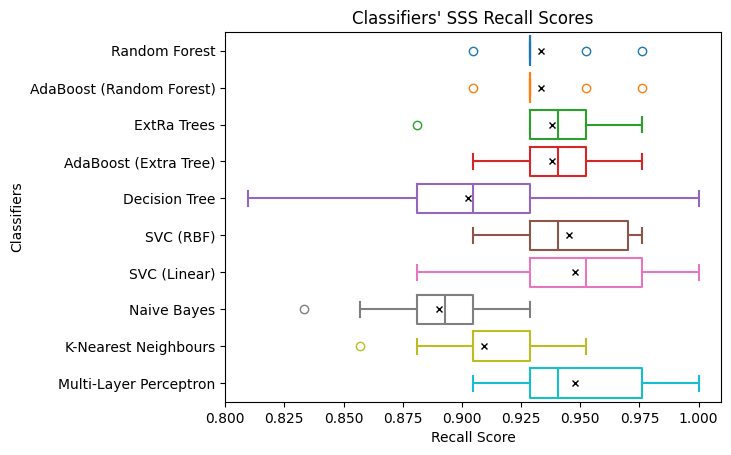

In [41]:
# Boxplot (Seaborne) of classifiers' recall scores resulting from Stratified Shuffle Split

# Convert list to Pandas Dataframe for Seaborne
recall_clf_df = DataFrame(recall_clf, columns=[name for name in classifiers.keys()])

fig, ax = subplots()

boxplot(data=recall_clf_df, orient='h', fill=False, showmeans=True, meanprops={'marker':'x',
                                                                                'markeredgecolor':'k',
                                                                                'markersize':'5'})
ax.set_title("Classifiers' SSS Recall Scores")
ax.set_xlabel('Recall Score')
ax.set_ylabel('Classifiers')

show()

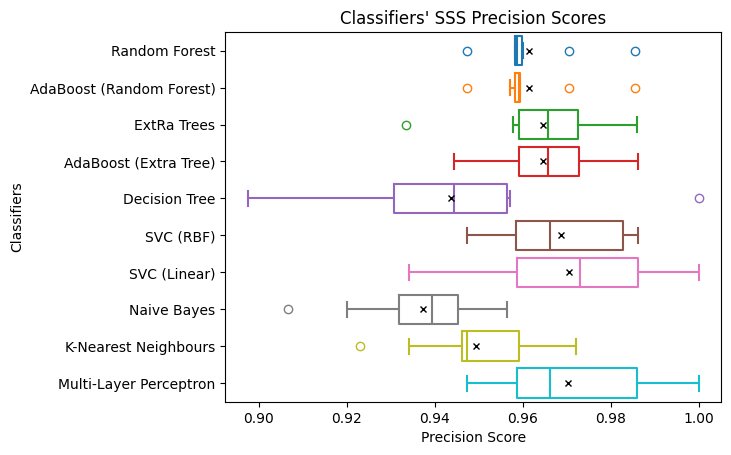

In [42]:
# Boxplot (Seaborne) of classifiers' precision scores resulting from Stratified Shuffle Split

# Convert list to Pandas Dataframe for Seaborne
precision_clf_df = DataFrame(precision_clf, columns=[name for name in classifiers.keys()])

fig, ax = subplots()

boxplot(data=precision_clf_df, orient='h', fill=False, showmeans=True, meanprops={'marker':'x',
                                                                                'markeredgecolor':'k',
                                                                                'markersize':'5'})
ax.set_title("Classifiers' SSS Precision Scores")
ax.set_xlabel('Precision Score')
ax.set_ylabel('Classifiers')

show()

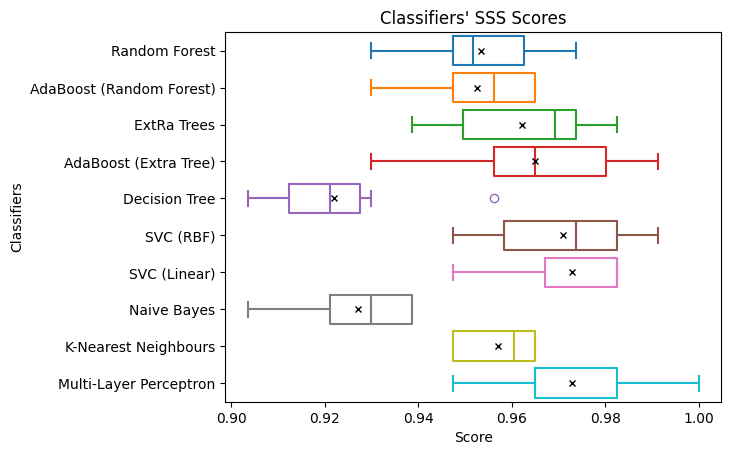

In [43]:
# Boxplot (Seaborne) of classifiers' scores resulting from Stratified Shuffle Split

# Convert list to Pandas Dataframe for Seaborne
scores_clf_df = DataFrame(scores_clf, columns=[name for name in classifiers.keys()])

fig, ax = subplots()

boxplot(data=scores_clf_df, orient='h', fill=False, showmeans=True, meanprops={'marker':'x',
                                                                                'markeredgecolor':'k',
                                                                                'markersize':'5'})
ax.set_title("Classifiers' SSS Scores")
ax.set_xlabel('Score')
ax.set_ylabel('Classifiers')

show()

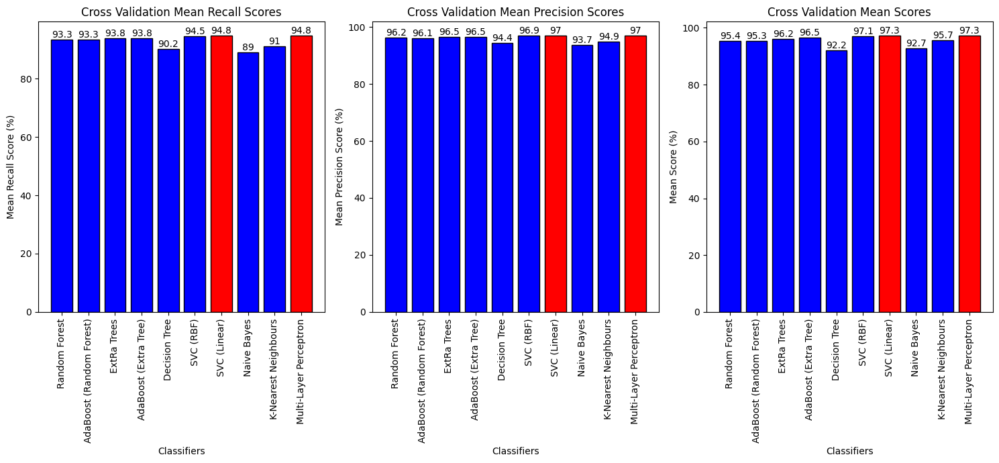

In [44]:
# PLot classifiers' mean scores resulting from Stratified Shuffle Split

plt_labels = list(classifiers.keys())  # Create a list of classifier names from the dictionary keys to be used as plot labels
xticks = arange(len(classifiers.keys()))  # Specify the number of x-ticks

recall_colour = ['r' if (bar == max(recall_mean)) else 'b' for bar in recall_mean]  # Colour the highest mean recall score red
precision_colour = ['r' if (bar == max(precision_mean)) else 'b' for bar in precision_mean]  # Colour the highest mean precision score red
score_colour = ['r' if (bar == max(scores_mean)) else 'b' for bar in scores_mean]  # Colour the highest mean score red

fig, ax = subplots(ncols=3, figsize=(15, 7))

recall_bar_con = ax[0].bar(x=xticks, height=recall_mean, tick_label=plt_labels, color=recall_colour, edgecolor='k')  # Create a bar container to label the bars with the scores
ax[0].bar_label(recall_bar_con)  # .bar_label() uses the the data values (i.e., height=) from the container (bar_con) as labels
ax[0].set_ylabel('Mean Recall Score (%)')
ax[0].set_xlabel('Classifiers')
ax[0].set_xticklabels(plt_labels, rotation=90)
ax[0].set_title("Cross Validation Mean Recall Scores");

precision_bar_con = ax[1].bar(x=xticks, height=precision_mean, tick_label=plt_labels, color=precision_colour, edgecolor='k')  # Create a bar container to label the bars with the scores
ax[1].bar_label(precision_bar_con)  # .bar_label() uses the the data values (i.e., height=) from the container (bar_con) as labels
ax[1].set_ylabel('Mean Precision Score (%)')
ax[1].set_xlabel('Classifiers')
ax[1].set_xticklabels(plt_labels, rotation=90)
ax[1].set_title("Cross Validation Mean Precision Scores");

score_bar_con = ax[2].bar(x=xticks, height=scores_mean, tick_label=plt_labels, color=score_colour, edgecolor='k')  # Create a bar container to label the bars with the scores
ax[2].bar_label(score_bar_con)  # .bar_label() uses the the data values (i.e., height=) from the container (bar_con) as labels
ax[2].set_ylabel('Mean Score (%)')
ax[2].set_xlabel('Classifiers')
ax[2].set_xticklabels(plt_labels, rotation=90)
ax[2].set_title("Cross Validation Mean Scores");

fig.tight_layout()

show()

<div class="alert alert-block alert-info">
<h3>All the classifiers perform well with almost all metric scores greater than 90%.<br>The recall score is particularly important for the breast cancer diagnosis to maximise the true positive rate (while minimising false negatives), while the precision score reflects minimising false positives.

In [45]:
# Split training and test data and scale X data
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=train_size, random_state=RNDM_STATE, shuffle=True)
X_train = rob_scl.fit_transform(X_train)
X_test = rob_scl.transform(X_test)

print(X.shape, X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(569, 30) (455, 30) (114, 30) (455,) (114,)


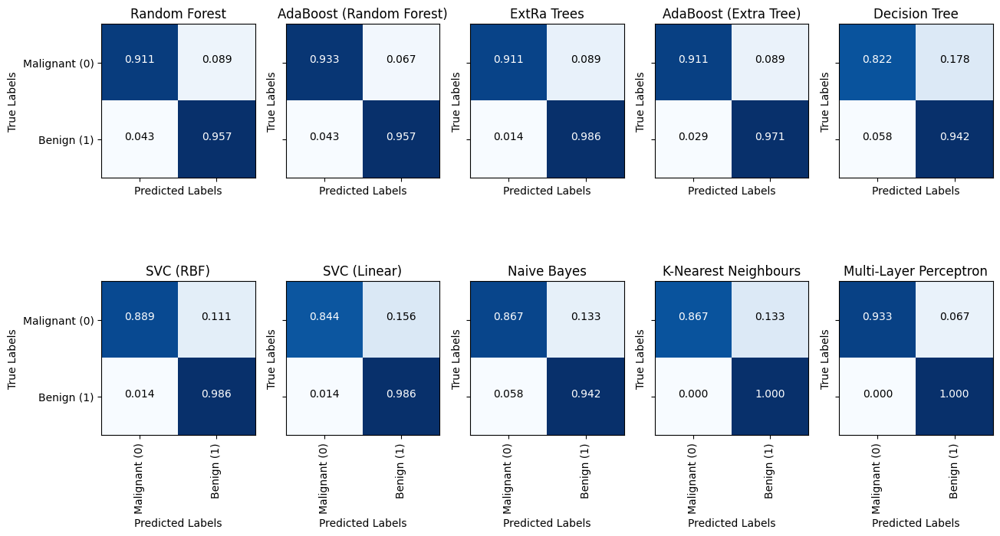

In [46]:
# Confusion matrix evaluation
class_names = ('Malignant (0)', 'Benign (1)')

fig, axes = subplots(figsize=(15, 8), ncols=5, nrows=2, sharey=True, sharex=True)

for ax, (name, clf) in zip(axes.ravel(), classifiers.items()):
    clf.fit(X_train, y_train)  # Fit with training data
    y_pred = clf.predict(X_test)  # Predict class labels using test data

    plot_confusion_matrix(y_test, y_pred, classes=class_names, normalize=True, ax=ax)
    ax.set_title(name, fontsize=12)

show()

<div class="alert alert-block alert-info">
<h3>Half the classifiers have high true positives (TP > 90%) <i>i.e.</i>, identified high percentage of malignancies correctly.<br><br>All classifiers also scored high true negatives (TN > 90%) <i>i.e.</i>, identified high percentage of benign cells correctly.<br><br>Since this dataset is concerned with correct diagnosis, having low false negatives is important - AdaBoost(RandomForest) fits the criteria.

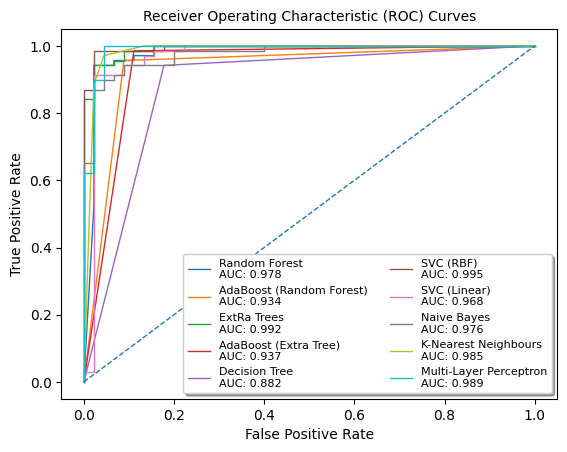

In [47]:
# ROC AUC evaluation
# A more comoprehensive picture of TPR v FPR (considering all thresholds of Confusion Matrix)

fig, ax = subplots()

for name, clf in classifiers.items():
    clf.fit(X_train, y_train)

    # Checking whether or not the object has 'decision_function':
    if hasattr(clf, 'decision_function'):  # If it does...
        y_score = clf.decision_function(X_test)
    else:
        y_score = clf.predict_proba(X_test)[:, 1]  # We only need probabilities for one column.

    # Obtaining the x- and y-axis values for the ROC curve:
    fpr, tpr, thresh = roc_curve(y_test, y_score)

    # Obtaining the AUC value:
    roc_auc = roc_auc_score(y_test, y_score)

    ax.plot(fpr, tpr, lw=1, label = f'{name}\nAUC: {round(roc_auc, 3)}')

ax.plot([0, 1], [0, 1], lw=1, linestyle='--') 
ax.set_title('Receiver Operating Characteristic (ROC) Curves', fontsize=10)
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.legend(ncols=2, fontsize=8, shadow=True)

show()

<div class="alert alert-block alert-info">
<h3>In evaluating which classifier to use, one needs to consider what is an acceptable FPR & FNR (<i>i.e.</i>, incorrect diagnoses). A high AUC aids in this decision - such as ExtRa Trees and SVC (RBF).

## Classification of scaled, PCA reduced data

In [48]:
# Cross Validation (Stratified Shuffle Split)

scores_pca_clf = []  # List to store classifiers' scores
recall_pca_clf = []
precision_pca_clf = []
for train_pca_ind, test_pca_ind in sss.split(X_scaled_pca, y):  # .split() returns indices for the train and test sample splits. Use scaled PCA data
    X_pca_train = X_pca[train_pca_ind, :]  # trains_pca_ind = indices of rows
    X_pca_test = X_pca[test_pca_ind, :]  # test_pca_ind = indices of rows
    y_pca_train = y[train_pca_ind]
    y_pca_test = y[test_pca_ind]

    scores_pca_splits = []  # List to store split scores for each classifier
    recall_pca_splits = []
    precision_pca_splits = []
    for name, clf in classifiers.items():
        clf.fit(X_pca_train, y_pca_train)
        y_pca_pred = clf.predict(X_pca_test)

        scores_pca_splits.append(clf.score(X_pca_test, y_pca_test))  # Calculates the scores for each of the classifiers using the same X_pca_test and y_pca_test splits, and appends to list
        recall_pca_splits.append(recall_score(y_pca_test, y_pca_pred, pos_label=0))
        precision_pca_splits.append(precision_score(y_pca_test, y_pca_pred))
    
    scores_pca_clf.append(scores_pca_splits)  # Appends all classifiers' scores for the same X_pca_test and y_pca_tesrt splits
    recall_pca_clf.append(recall_pca_splits)
    precision_pca_clf.append(precision_pca_splits)

scores_pca_mean = round(mean(scores_pca_clf, axis=0) * 100, 1)  # axis=0: calculate means of columns/classifier
recall_pca_mean = round(mean(recall_pca_clf, axis=0) * 100, 1)
precision_pca_mean = round(mean(precision_pca_clf, axis=0) * 100, 1)

# print(scores_pca_mean)
# print(recall_pca_mean)
# print(precision_pca_mean)

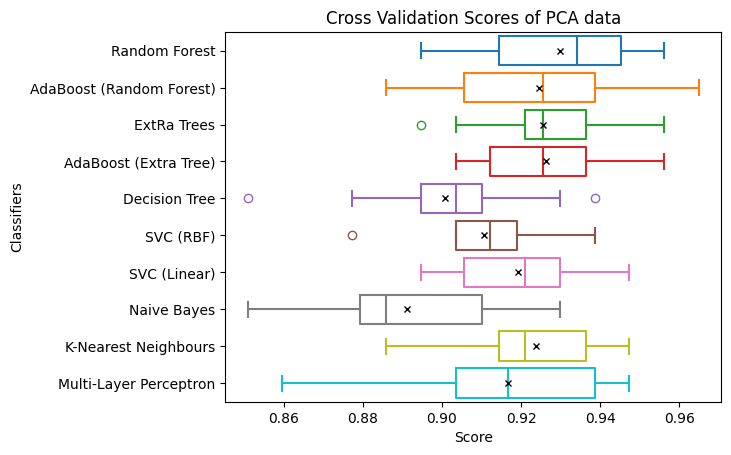

In [49]:
# Boxplot (Seaborne) of classifiers' scores resulting from Stratified Shuffle Split

# Convert list to Pandas Dataframe for Seaborne
scores_pca_clf_df = DataFrame(scores_pca_clf, columns=[name for name in classifiers.keys()])

fig, ax = subplots()

boxplot(data=scores_pca_clf_df, orient='h', fill=False, showmeans=True, meanprops={'marker':'x',
                                                                                'markerfacecolor':'w',
                                                                                'markeredgecolor':'k',
                                                                                'markersize':'5'})
ax.set_title("Cross Validation Scores of PCA data")
ax.set_xlabel('Score')
ax.set_ylabel('Classifiers')

show()

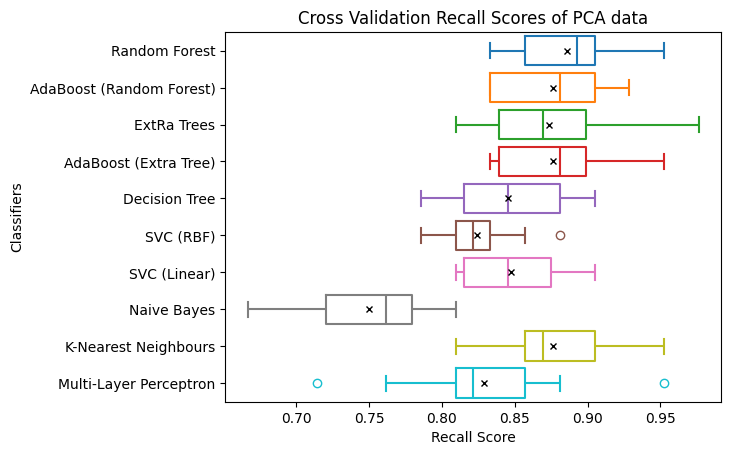

In [50]:
# Boxplot (Seaborne) of classifiers' recall scores resulting from Stratified Shuffle Split

# Convert list to Pandas Dataframe for Seaborne
recall_pca_clf_df = DataFrame(recall_pca_clf, columns=[name for name in classifiers.keys()])

fig, ax = subplots()

boxplot(data=recall_pca_clf_df, orient='h', fill=False, showmeans=True, meanprops={'marker':'x',
                                                                                'markerfacecolor':'w',
                                                                                'markeredgecolor':'k',
                                                                                'markersize':'5'})
ax.set_title("Cross Validation Recall Scores of PCA data")
ax.set_xlabel('Recall Score')
ax.set_ylabel('Classifiers')

show()

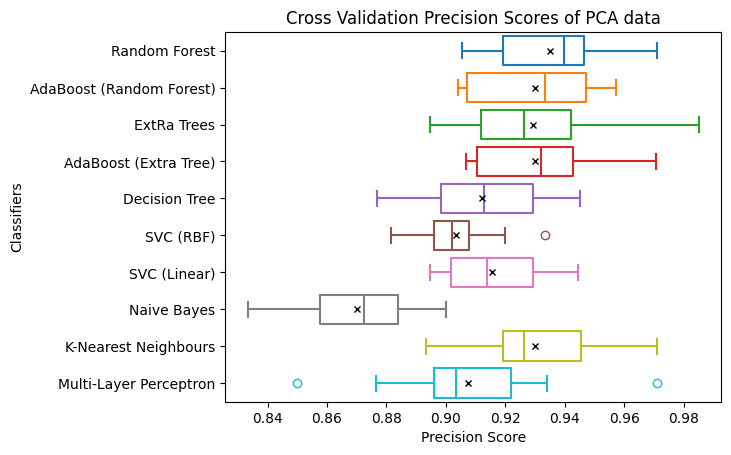

In [51]:
# Boxplot (Seaborne) of classifiers' precision scores resulting from Stratified Shuffle Split

# Convert list to Pandas Dataframe for Seaborne
precision_pca_clf_df = DataFrame(precision_pca_clf, columns=[name for name in classifiers.keys()])

fig, ax = subplots()

boxplot(data=precision_pca_clf_df, orient='h', fill=False, showmeans=True, meanprops={'marker':'x',
                                                                                'markerfacecolor':'w',
                                                                                'markeredgecolor':'k',
                                                                                'markersize':'5'})
ax.set_title("Cross Validation Precision Scores of PCA data")
ax.set_xlabel('Precision Score')
ax.set_ylabel('Classifiers')

show()

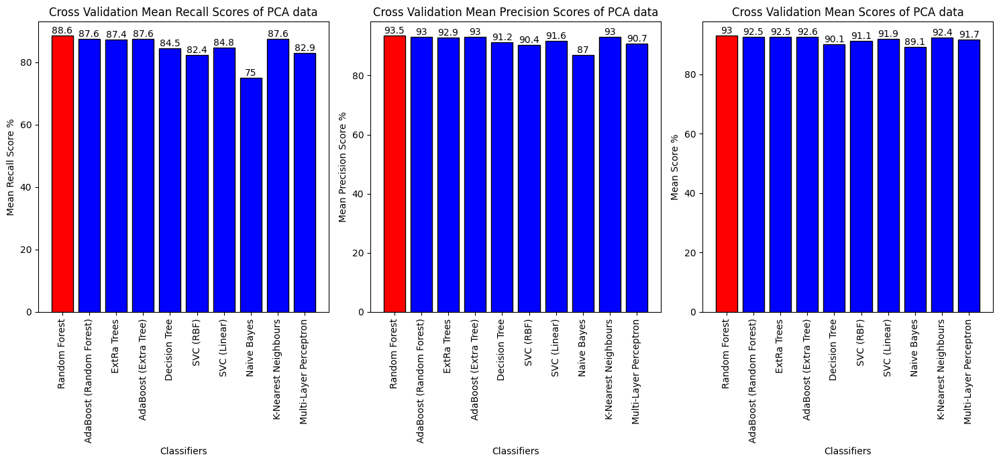

In [52]:
# PLot classifiers' mean PCA scores resulting from Stratified Shuffle Split

plt_labels = list(classifiers.keys())
xticks = arange(len(classifiers.keys()))

score_pca_colour = ['r' if (bar == max(scores_pca_mean)) else 'b' for bar in scores_pca_mean]
recall_pca_colour = ['r' if (bar == max(recall_pca_mean)) else 'b' for bar in recall_pca_mean]
precision_pca_colour = ['r' if (bar == max(precision_pca_mean)) else 'b' for bar in precision_pca_mean]

fig, ax = subplots(ncols=3, figsize=(15, 7))

recall_pca_bar_con = ax[0].bar(x=xticks, height=recall_pca_mean, tick_label=plt_labels, color=recall_pca_colour, edgecolor='k')
ax[0].bar_label(recall_pca_bar_con)  # .bar_label() uses the the data values (i.e., height=) from the container (bar_con) as labels
ax[0].set_ylabel('Mean Recall Score %')
ax[0].set_xlabel('Classifiers')
ax[0].set_xticklabels(plt_labels, rotation=90)
ax[0].set_title("Cross Validation Mean Recall Scores of PCA data")

precision_pca_bar_con = ax[1].bar(x=xticks, height=precision_pca_mean, tick_label=plt_labels, color=precision_pca_colour, edgecolor='k')
ax[1].bar_label(precision_pca_bar_con)  # .bar_label() uses the the data values (i.e., height=) from the container (bar_con) as labels
ax[1].set_ylabel('Mean Precision Score %')
ax[1].set_xlabel('Classifiers')
ax[1].set_xticklabels(plt_labels, rotation=90)
ax[1].set_title("Cross Validation Mean Precision Scores of PCA data")

score_pca_bar_con = ax[2].bar(x=xticks, height=scores_pca_mean, tick_label=plt_labels, color=score_pca_colour, edgecolor='k')
ax[2].bar_label(score_pca_bar_con)  # .bar_label() uses the the data values (i.e., height=) from the container (bar_con) as labels
ax[2].set_ylabel('Mean Score %')
ax[2].set_xlabel('Classifiers')
ax[2].set_xticklabels(plt_labels, rotation=90)
ax[2].set_title("Cross Validation Mean Scores of PCA data")

fig.tight_layout()

show()

<div class="alert alert-block alert-info">
<h3>Cross validation of classifiers using scaled, PCA data yields slightly lower but comparable mean precision scores and mean scores to unreduced data.<br>However, the mean recall scores from PCA data are significantly worse than unscaled data - the highest mean recall score from PCA (88.6%) is only as good as the lowest mean recall score resulting from unscaled data (89%).<br>For the diagnosis of breast cancer, minimising false negatives is an important criterion.

In [53]:
# Split training and test data from scaled PCA data
X_pca_train, X_pca_test, y_pca_train, y_pca_test = train_test_split(X_scaled_pca, y, train_size=train_size, random_state=RNDM_STATE, shuffle=True)
print(X_pca.shape, X_pca_train.shape, X_pca_test.shape, y_pca_train.shape, y_pca_test.shape)

(569, 2) (455, 17) (114, 17) (455,) (114,)


In [54]:
# Train models and evaluate scores

# plt_labels = []
# model_scores = []
# for name, clf in classifiers.items():
    # clf.fit(X_pca_train, y_pca_train)
    # y_pred = clf.predict(X_pca_test)

    # plt_labels.append(name)
    # score = round(clf.score(X_pca_test, y_pca_test) * 100, 1)
    # model_scores.append(score)

# xticks = arange(len(classifiers.keys()))

# highlight = ['r' if (bar == max(model_scores)) else 'b' for bar in model_scores]

# fig, ax = subplots()

# bar_con = ax.bar(x=xticks, height=model_scores, tick_label=plt_labels, color=highlight, edgecolor='k')
# ax.bar_label(bar_con)  # .bar_label() uses the the data values (i.e., height=) from the container (bar_con) as labels
# ax.set_ylabel('Score %')
# ax.set_xlabel('Classifiers')
# ax.set_xticklabels(plt_labels, rotation=90)
# ax.set_title('Classifier Scores')

# show()

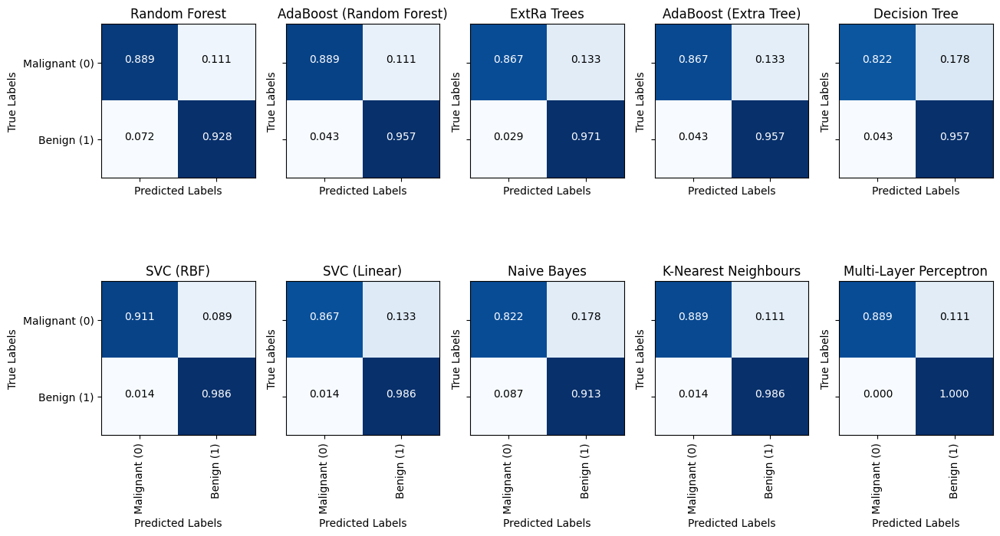

In [55]:
# Confusion matrix evaluation
class_names = ('Malignant (0)', 'Benign (1)')

fig, axes = subplots(figsize=(15, 8), ncols=5, nrows=2, sharey=True, sharex=True)

for ax, (name, clf) in zip(axes.ravel(), classifiers.items()):
    clf.fit(X_pca_train, y_pca_train)  # Fit with training data
    y_pca_pred = clf.predict(X_pca_test)  # Predict class labels using test data

    plot_confusion_matrix(y_pca_test, y_pca_pred, classes=class_names, normalize=True, ax=ax)
    ax.set_title(name, fontsize=12)

show()

<div class="alert alert-block alert-info">
<h3>The TP are generally lower than for unreduced data, but the TN are slightly better, for the given threshold. FN are generally slightly higher.

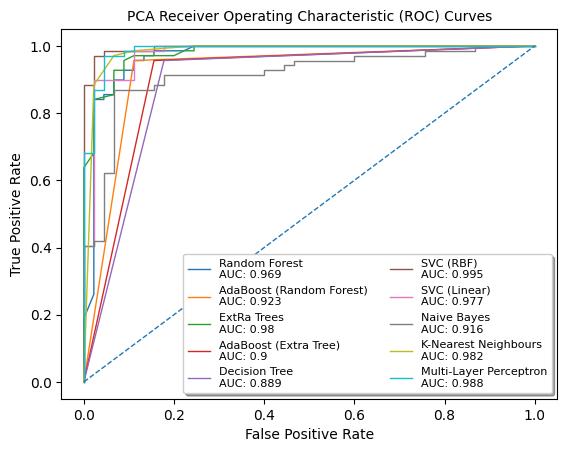

In [56]:
# ROC AUC evaluation

fig, ax = subplots()

for name, clf in classifiers.items():
    clf.fit(X_pca_train, y_pca_train)

    # Checking whether or not the object has `decision_function`:
    if hasattr(clf, 'decision_function'):  # If it does...
        y_score = clf.decision_function(X_pca_test)
    else:  # If not...
        y_score = clf.predict_proba(X_pca_test)[:, 1]  # We only need probabilities for one column: Malignant/0.

    # Obtaining the x- and y-axis values for the ROC curve:
    fpr, tpr, thresh = roc_curve(y_pca_test, y_score)

    # Obtaining the AUC value:
    roc_auc = roc_auc_score(y_pca_test, y_score)

    ax.plot(fpr, tpr, lw=1, label = f'{name}\nAUC: {round(roc_auc, 3)}')

ax.plot([0, 1], [0, 1], lw=1, linestyle='--') 
ax.set_title('PCA Receiver Operating Characteristic (ROC) Curves', fontsize=10)
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.legend(ncols=2, fontsize=8, shadow=True)

show()

<div class="alert alert-block alert-info">
<h3>The AUC scores are generally similar to unreduced data - fairly good.

<div class="alert alert-block alert-success">
<h1>Feature Importances<h1>

## Unreduced dataset
<div class="alert alert-block alert-info">
<h3>Support Vector Classification (linear) and ExtRa Trees both performed consistently well by metrics measured above. Will explore feature importances for both.

In [57]:
# Extract feature importances after ExtRa Trees fitting
et_clf = ExtraTreesClassifier(random_state=RNDM_STATE)

et_clf.fit(X_scaledRob, y)  # Fit to scaled data
# et_clf.fit(X, y)  # Fit to unscaled data

f_imp_et = et_clf.feature_importances_  # Get feature importances (f_imp_et)
# print(f_imp_et)

mif_ind_et = where(f_imp_et == max(f_imp_et))  # Get index of largest feature importance; mif = most important feature
# print(mif_ind_et)

mif_name_et = X_df.columns[mif_ind_et]  # Get feature name of largest feature importance
# print(mif_name_et)

The feature 'radius_worst' has the higest feature importance (0.09703295816459709).


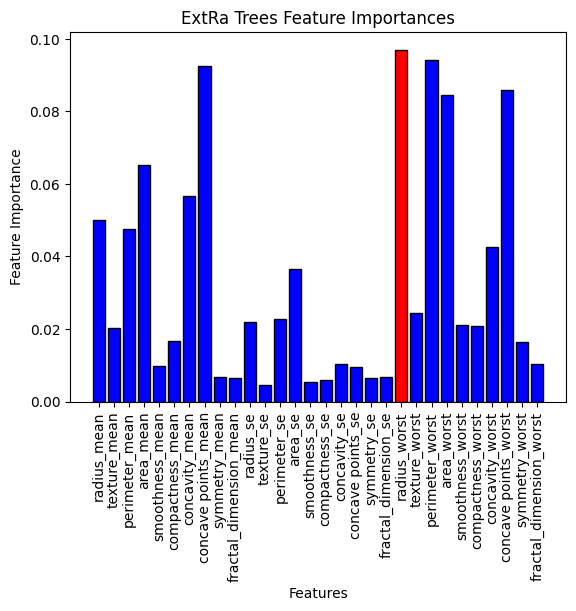

In [58]:
# Plot feature importances after ExtRa Trees fitting
plt_labels = list(X_df.columns)
xticks = arange(len(X_df.columns))
bar_colour = ['r' if (bar == max(f_imp_et)) else 'b' for bar in f_imp_et]

fig, ax = subplots()

ax.bar(x=xticks, height=f_imp_et, tick_label=plt_labels, color=bar_colour, edgecolor='k')
ax.set_ylabel('Feature Importance')
ax.set_xlabel('Features')
ax.set_xticklabels(plt_labels, rotation=90)
ax.set_title('ExtRa Trees Feature Importances')

print(f"The feature '{mif_name_et[0]}' has the higest feature importance ({max(f_imp_et)}).")

<div class="alert alert-block alert-info">
<h3>About half a dozen features are quite dominant (>0.6) in their contribution to the modelling.

In [59]:
# Extract feature importances after SVC (linear) fitting
svc_lin = LinearSVC(random_state=RNDM_STATE)

svc_lin.fit(X_scaledRob, y)

# Coefficents (.coeffs_) indicate the importance of each feature.
# A higher absolute value of the coefficient suggests that the feature has a greater impact on the classification decision.
# Positive coefficients indicate that the feature contributes to the classification of one class, while negative coefficients indicate contribution to the other class.

f_imp_svc = svc_lin.coef_.ravel()  # Returns a 2D array, .ravel() to flatten it to 1D; f_imp_svc = feature importance
# print(f_imp.shape)
# print(f_imp)

# f_imp_abs = abs(f_imp)  # Get absolute values of coeffs
# f_imp_ind = where(f_imp_abs == max(f_imp_abs))  # Return index of largest coeff
# print(f_imp_ind[0], f_imp_abs)

f_imp_pos = max(f_imp_svc)  # Get the largest positive coefficient
f_imp_pos_ind = where(f_imp_svc == f_imp_pos) # Returns the index of the largest positive coefficient
mif_pos_name = X_df.columns[f_imp_pos_ind]  # Returns the feature name at index of the largest positive coeff/feature importance; mif = most important feature
# print(f_imp_pos_ind[0], f_imp_pos, mif_pos_name[0])

f_imp_neg = min(f_imp_svc)  # Get the largest negative coefficient
f_imp_neg_ind = where(f_imp_svc == f_imp_neg) # Returns the index of the largest negative coefficient
mif_neg_name = X_df.columns[f_imp_neg_ind]  # Returns the feature name at index of the largest negative coeff/feature importance; mif = most important feature
# print(f_imp_neg_ind[0], f_imp_neg, mif_neg_name[0])

The feature 'compactness_mean' has the largest importance (0.7988402874111353) for one class.
The feature 'texture_worst' has the largest importance (-1.0259079527904367) for the other class.


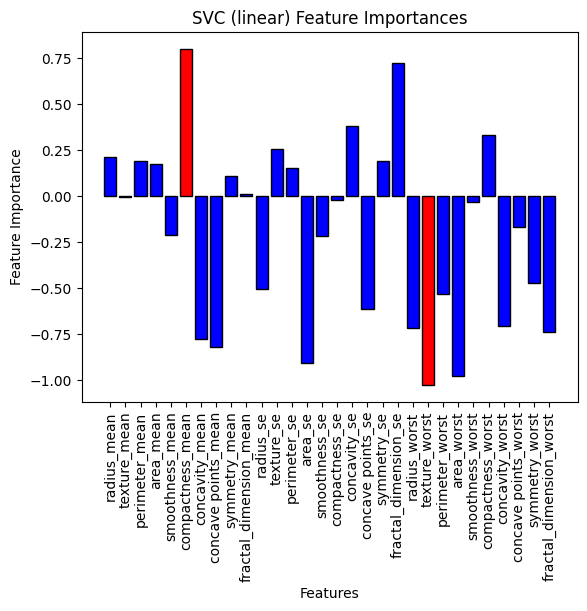

In [60]:
# Plot feature importances
plt_labels = list(X_df.columns)
xticks = arange(len(X_df.columns))
highlight = ['r' if (f_name == mif_pos_name) or (f_name == mif_neg_name) else 'b' for f_name in plt_labels]

fig, ax = subplots()

ax.bar(x=xticks, height=f_imp_svc, tick_label=plt_labels, color=highlight, edgecolor='k')
ax.set_ylabel('Feature Importance')
ax.set_xlabel('Features')
ax.set_xticklabels(plt_labels, rotation=90)
ax.set_title('SVC (linear) Feature Importances')

# print(f"The feature '{mif[0]}' has the higest feature importance ({max(f_imp)}).")
print(f"The feature '{mif_pos_name[0]}' has the largest importance ({f_imp_svc[f_imp_pos_ind][0]}) for one class.")
print(f"The feature '{mif_neg_name[0]}' has the largest importance ({f_imp_svc[f_imp_neg_ind][0]}) for the other class.")

<div class="alert alert-block alert-info">
<h3>The two classifiers return different feature importances.<br>
Interpretation of the feature importances from SVC (linear) is not as straightforward as for ExtRa Trees.<br>
Coefficents (.coeffs_) indicate the importance of each feature.<br>
A higher absolute value of the coefficient suggests that the feature has a greater impact on the classification decision.<br>
Positive coefficients indicate that the feature contributes to the classification of one class, while negative coefficients indicate contribution to the other class.<br>
There are more features with negative coefficients < -0.5 contributing to one classification than there are features with positive coefficients (<i>i.e.</i>, only two > 0.5) contributing to the other classification.

## PCA reduced dataset

The feature 'area_se' has the higest feature importance (0.41911738865509396) for PC1.


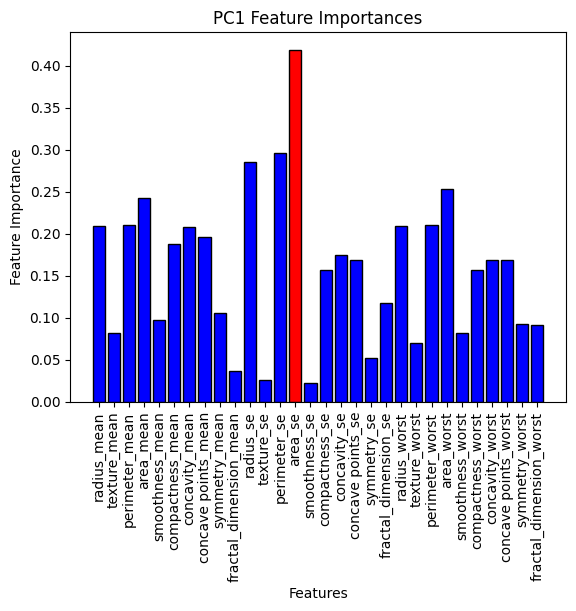

In [61]:
# Obtain the feature weights from the PC eigenvectors

feature_weights = pca_scaled.components_  # Feature weights (aka loading scores) (.components_) are the Eigenvectors of the principal components

max_feature_weight_ind = where(feature_weights[0] == max(feature_weights[0])) # Get the index of the highest feature weight (eigenvector) in PC1 ([0])

mif_pca = X_df.columns[max_feature_weight_ind]  # Returns the feature name and dtype at index of the highest feature weight; mif = most important feature

# Plot PCA feature importances
plt_labels = list(X_df.columns)
xticks = arange(len(X_df.columns))
highlight = ['r' if (bar == max(feature_weights[0])) else 'b' for bar in feature_weights[0]]

fig, ax = subplots()

ax.bar(x=xticks, height=feature_weights[0], tick_label=plt_labels, color=highlight, edgecolor='k')
ax.set_ylabel('Feature Importance')
ax.set_xlabel('Features')
ax.set_xticklabels(plt_labels, rotation=90)
ax.set_title('PC1 Feature Importances')

print(f"The feature '{mif_pca[0]}' has the higest feature importance ({max(feature_weights[0])}) for PC1.")

<div class="alert alert-block alert-success">
<h1>Unit testing trained ExtRa Trees model<h1>

In [62]:
# From the explorartory data analysis, we noticed that the means of the malignant features are generally greater than the means of the benign features

# Create 'new patient' data from the means of the features of the classes (diagnosis)
new_data = df.groupby('diagnosis').mean().to_numpy()
# print(new_data, new_data.shape)

mal_means = new_data[0, :].reshape(1, 30)  # Dummy malignant data based on means
# print(mal_means, mal_means.shape)

ben_means = new_data[1, :].reshape(1, 30)  # Dummy benign data based on means
# print(ben_means, ben_means.shape)

et = ExtraTreesClassifier()
et.fit(X, y)

def diagnose(data):
    y_pred = et.predict(data)
    prob = et.predict_proba(data)
    # print(y_pred1)
    # print(prob1)
    if y_pred == 0:
        print(f"Malignant (probability {prob[0][0]})")
    else:
        print(f"Benign (probability {prob[0][1]})")


# Predict diagnosis of 'new patient' using dummy malignant data
diagnose(mal_means)

# Predict diagnosis of 'new patient' using dummy benign data
diagnose(ben_means)

Malignant (probability 1.0)
Benign (probability 1.0)


<div class="alert alert-block alert-info">
<h3>The trained model correctly predicted the simple dummy datasets with very good confidence!